##### _

In [1]:
# Data generation function - this is not part of the task, and is only to simulate pulling from a SQL database
# Don't worry about changing this - it's just to make the notebook a little easier!
import numpy as np
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler


def collect_from_database(query: str) -> pd.DataFrame:
    print(f"Executing: {query}")
    n_rows = 10_000
    n_features = 16
    features, labels = make_classification(
        n_samples=n_rows,
        n_features=16,
        n_informative=7,
        n_redundant=4,
        n_repeated=3,
        n_classes=2,
        class_sep=1.2,
        flip_y=0.035,  # Randomly invert y for added noise
        weights=[0.85, 0.15],
        random_state=1889,
    )
    df = pd.DataFrame(features, columns=[f"numeric_{i+1}" for i in range(n_features)])
    df.insert(value=labels, loc=0, column="claim_status")
    df = df.rename(
        columns={
            "numeric_1": "age",
            "numeric_2": "height_cm",
            "numeric_3": "weight_kg",
            "numeric_4": "income",
            "numeric_5": "financial_hist_1",
            "numeric_6": "financial_hist_2",
            "numeric_7": "financial_hist_3",
            "numeric_8": "financial_hist_4",
            "numeric_9": "credit_score_1",
            "numeric_10": "credit_score_2",
            "numeric_11": "credit_score_3",
            "numeric_12": "insurance_hist_1",
            "numeric_13": "insurance_hist_2",
            "numeric_14": "insurance_hist_3",
            "numeric_15": "insurance_hist_4",
            "numeric_16": "insurance_hist_5",
        }
    )
    df["age"] = MinMaxScaler(feature_range=(18, 95)).fit_transform(
        df["age"].values[:, None]
    )
    df["age"] = df["age"].astype("int")
    df["height_cm"] = MinMaxScaler(feature_range=(140, 210)).fit_transform(
        df["height_cm"].values[:, None]
    )
    df["height_cm"] = df["height_cm"].astype("int")
    df["weight_kg"] = MinMaxScaler(feature_range=(45, 125)).fit_transform(
        df["weight_kg"].values[:, None]
    )
    df["weight_kg"] = df["weight_kg"].astype("int")
    df["income"] = MinMaxScaler(feature_range=(0, 250_000)).fit_transform(
        df["income"].values[:, None]
    )
    df["income"] = df["income"].astype("int")
    df["credit_score_1"] = MinMaxScaler(feature_range=(0, 999)).fit_transform(
        df["credit_score_1"].values[:, None]
    )
    df["credit_score_1"] = df["credit_score_1"].astype("int")
    df["credit_score_2"] = MinMaxScaler(feature_range=(0, 700)).fit_transform(
        df["credit_score_2"].values[:, None]
    )
    df["credit_score_2"] = df["credit_score_2"].astype("int")
    df["credit_score_3"] = MinMaxScaler(feature_range=(0, 710)).fit_transform(
        df["credit_score_3"].values[:, None]
    )
    df["credit_score_3"] = df["credit_score_3"].astype("int")
    df["bmi"] = (df["weight_kg"] / ((df["height_cm"] / 100) ** 2)).astype("int")
    df["gender"] = np.where(
        df["claim_status"] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.46, 0.54]),
        np.random.choice([1, 0], size=(n_rows), p=[0.52, 0.48]),
    )
    df["marital_status"] = np.random.choice(
        ["A", "B", "C", "D", "E", "F"],
        size=(n_rows),
        p=[0.2, 0.15, 0.1, 0.25, 0.15, 0.15],
    )
    df["occupation"] = np.random.choice(
        ["A", "B", "C", "D", "E", "F", "G"], size=(n_rows)
    )
    df["location"] = np.random.choice(list(string.ascii_uppercase), size=(n_rows))
    df["prev_claim_rejected"] = np.where(
        df["claim_status"] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.08, 0.92]),
        np.random.choice([1, 0], size=(n_rows), p=[0.16, 0.84]),
    )
    df["known_health_conditions"] = np.random.choice(
        [1, 0], size=(n_rows), p=[0.06, 0.94]
    )
    df["uk_residence"] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df["family_history_1"] = np.random.choice([1, 0], size=(n_rows), p=[0.22, 0.78])
    df["family_history_2"] = np.random.choice([1, 0], size=(n_rows), p=[0.25, 0.75])
    df["family_history_3"] = np.random.choice(
        [1, None, 0], size=(n_rows), p=[0.12, 0.81, 0.07]
    )
    df["family_history_4"] = np.random.choice([1, 0], size=(n_rows), p=[0.27, 0.73])
    df["family_history_5"] = np.random.choice([1, 0], size=(n_rows), p=[0.31, 0.69])
    df["product_var_1"] = np.random.choice([1, 0], size=(n_rows), p=[0.38, 0.62])
    df["product_var_2"] = np.random.choice([1, 0], size=(n_rows), p=[0.55, 0.45])
    df["product_var_3"] = np.random.choice(
        ["A", "B", "C", "D"], size=(n_rows), p=[0.23, 0.28, 0.31, 0.18]
    )
    df["product_var_4"] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df["health_status"] = np.random.randint(1, 5, size=(n_rows))
    df["driving_record"] = np.random.randint(1, 5, size=(n_rows))
    df["previous_claim_rate"] = np.where(
        df["claim_status"] == 0,
        np.random.choice(
            [1, 2, 3, 4, 5], size=(n_rows), p=[0.48, 0.29, 0.12, 0.08, 0.03]
        ),
        np.random.choice(
            [1, 2, 3, 4, 5], size=(n_rows), p=[0.12, 0.28, 0.34, 0.19, 0.07]
        ),
    )
    df["education_level"] = np.random.randint(0, 7, size=(n_rows))
    df["income level"] = pd.cut(df["income"], bins=5, labels=False, include_lowest=True)
    df["n_dependents"] = np.random.choice(
        [1, 2, 3, 4, 5], size=(n_rows), p=[0.23, 0.32, 0.27, 0.11, 0.07]
    )
    df["employment_type"] = np.random.choice(
        [1, None, 0], size=(n_rows), p=[0.16, 0.7, 0.14]
    )
    return df

# **Pre-selection Task:** Alex's Notebook

### Imports

In [2]:
import string

import matplotlib.pyplot as plt
import seaborn as sns
import shap # this module is not supported for python 3.11 and later. 3.11 goes eol October 2026
import xgboost as xgb
from scipy import stats

# from sklearn.datasets import *
from sklearn.metrics import (
    accuracy_score,
    cohen_kappa_score,
    confusion_matrix,
    f1_score,
    log_loss,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import RandomizedSearchCV, train_test_split

# Seed
np.random.seed(1889)

### Data Collection

In [3]:
# Moved env variables to config/dev/data_collection.yaml
# Client secret moved to Githud Secrets. In future, this should be migrated to a more secure secrets management service such as SSM Parameter Store or Azure Key Vault.

In [3]:
dataset_from_database = collect_from_database("SELECT * FROM CLAIMS.DS_DATASET")
dataset_from_database.head(10)

Executing: SELECT * FROM CLAIMS.DS_DATASET


,claim_status,age,height_cm,weight_kg,income,financial_hist_1,financial_hist_2,financial_hist_3,financial_hist_4,credit_score_1,...,product_var_2,product_var_3,product_var_4,health_status,driving_record,previous_claim_rate,education_level,income level,n_dependents,employment_type
0,0,49,182,80,155292,1.408797,-0.573517,-0.464914,3.249624,519,...,0,A,0,3,2,1,2,3,1,0
1,0,55,185,86,169232,2.402368,1.135213,0.780797,3.075214,500,...,1,C,1,2,4,3,2,3,2,None
2,0,55,169,82,173856,-1.182139,0.337877,1.754185,1.932426,422,...,0,C,1,4,1,1,2,3,2,1
3,0,43,179,76,150264,1.107481,-1.123652,1.966727,-0.130857,297,...,1,D,1,4,1,1,0,3,2,None
4,0,56,167,86,118449,-0.985055,-0.604696,-0.650367,-1.329931,440,...,1,B,1,3,3,1,0,2,1,None
5,0,47,184,89,147966,-0.532343,1.668309,1.672834,1.083610,423,...,1,B,1,2,3,1,3,2,5,None
6,0,58,161,64,124218,-1.594298,-0.059563,-2.565507,-1.216361,392,...,0,A,1,2,1,1,2,2,3,None
7,0,55,170,96,109517,-0.867955,-1.461820,-0.543154,-1.298344,430,...,0,A,1,1,3,1,5,2,2,0
8,0,55,166,87,182091,-2.868900,-0.193578,2.230964,2.590524,349,...,0,D,1,1,2,2,5,3,3,1
9,0,52,166,78,171201,-2.935281,1.091528,1.392789,2.102653,417,...,1,B,0,1,2,1,5,3,5,None


In [4]:
# Check distribution of labels
dataset_from_database["claim_status"].value_counts()

claim_status
0    8397
1    1603
Name: count, dtype: int64

In [6]:
# optionally save CSV locally

# dataset_from_database.to_csv("dataset_from_database.csv")

### Data Wrangling

In [6]:
total = dataset_from_database.isnull().sum()
percent = (
    dataset_from_database.isnull().sum() / dataset_from_database.isnull().count() * 100
)
missing_df = pd.concat([total, percent], axis=1, keys=["Total", "Percent"])
types = []
for col in dataset_from_database.columns:
    dtype = str(dataset_from_database[col].dtype)
    types.append(dtype)
missing_df["Types"] = types
dataset_from_database_no_missing_values = pd.DataFrame()
dataset_from_database_no_missing_values = dataset_from_database.drop(
    columns=["family_history_3", "employment_type"]
)
dataset_from_database.drop(
    columns=["family_history_3", "employment_type"], inplace=True
)

KeyError: "['family_history_3', 'employment_type'] not found in axis"

In [7]:
for i in dataset_from_database_no_missing_values.columns:
    print(f"Column: {i}, dtype: {dataset_from_database[i].dtype}")

In [8]:
non_numerical = [
    "gender",
    "marital_status",
    "occupation",
    "location",
    "prev_claim_rejected",
    "known_health_conditions",
    "uk_residence",
    "family_history_1",
    "family_history_2",
    "family_history_4",
    "family_history_5",
    "product_var_1",
    "product_var_2",
    "product_var_3",
    "health_status",
    "driving_record",
    "previous_claim_rate",
    "education_level",
    "income level",
    "n_dependents",
]

for column in non_numerical:
    dataset_from_database[column] = dataset_from_database[column].astype("category")

### EDA

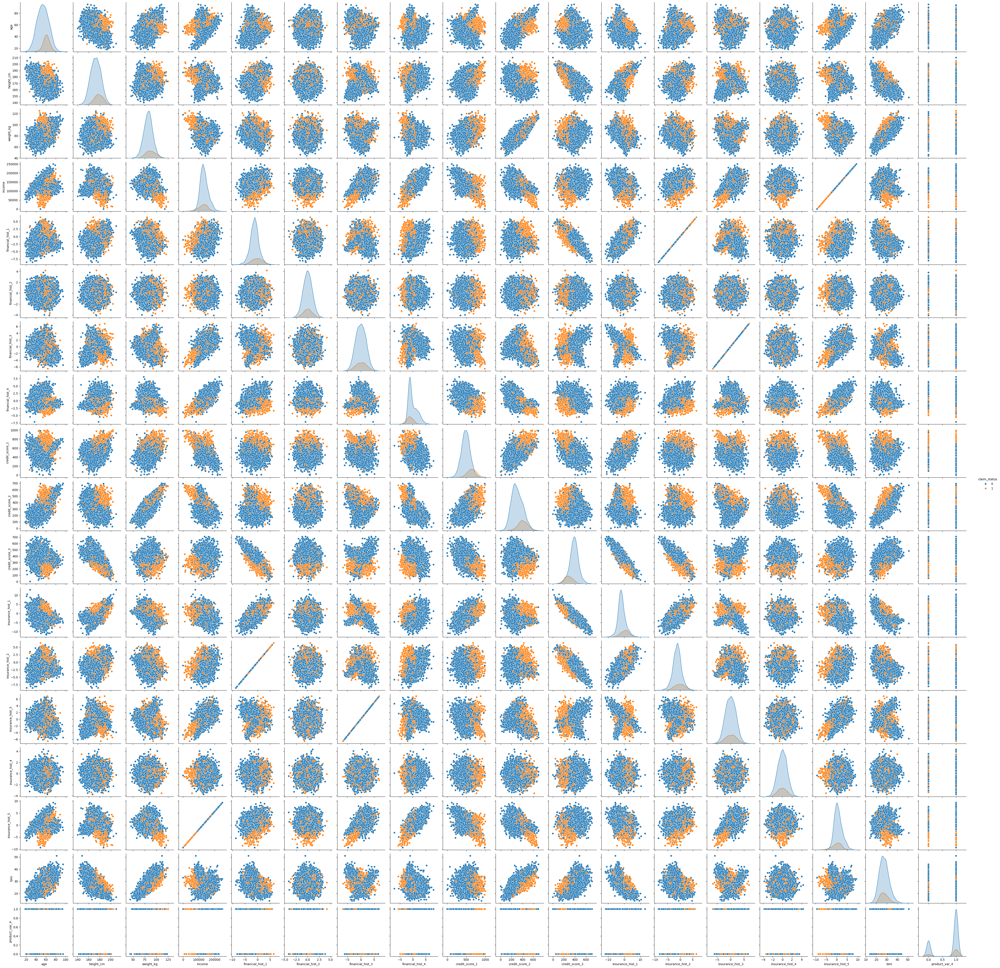

In [ ]:
for column in dataset_from_database.columns:
    sns.pairplot(column, hue="claim_status") # Takes 2-3 minutes to run!

In [ ]:
corr = dataset_from_database[
    dataset_from_database.columns.drop(
        ["product_var_3", "marital_status", "occupation", "location"]
    )
].corr()
diag_mask = np.triu(np.ones_like(corr, dtype=bool))

# Create axes and colourmap
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(
    corr,
    mask=diag_mask,
    cmap=cmap,
    vmax=0.3,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
)

In [ ]:
for column in [
    "age",
    "height_cm",
    "weight_kg",
    "income",
    "financial_hist_1",
    "financial_hist_2",
    "financial_hist_3",
    "financial_hist_4",
    "credit_score_1",
    "credit_score_2",
    "credit_score_3",
    "insurance_hist_1",
    "insurance_hist_2",
    "insurance_hist_3",
    "insurance_hist_4",
]:
    fig, ax = plt.subplots(1, 2, figsize=(6, 4))
    sns.boxplot(data=dataset_from_database, y=column, orient="v", ax=ax[0])
    sns.histplot(dataset_from_database, x=column, kde=True, ax=ax[1])

plt.show()

In [ ]:
column_plots = dataset_from_database.columns.drop(
    [
        "claim_status",
        "financial_hist_1",
        "financial_hist_2",
        "financial_hist_3",
        "financial_hist_4",
        "insurance_hist_1",
        "insurance_hist_2",
        "insurance_hist_3",
        "insurance_hist_4",
        "insurance_hist_5",
        "income",
    ]
)

### Initial Model Training

In [ ]:
# Separate the Dataframe into labels and features
X, y = (
    dataset_from_database.drop("claim_status", axis=1),
    dataset_from_database[["claim_status"]],
)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1889
)

# Build the evaluation set & metric list
eval_set = [(X_train, y_train)]
eval_metrics = ["auc", "rmse", "logloss"]

In [ ]:
model = xgb.XGBClassifier(
    objective="binary:logistic", eval_metric=eval_metrics, enable_categorical=True
)

model.fit(X_test, y_test, eval_set=eval_set, verbose=10)

### Model Evaluation

In [ ]:
train_class_preds = model.predict(X_train)
test_class_preds = model.predict(X_test)
train_prob_preds = model.predict_proba(X_train)[:, 1]
test_prob_preds = model.predict_proba(X_test)[:, 1]

y = np.array(y_train)
y = y.astype(int)
yhat = np.array(train_class_preds)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
training_data_kappa_score = round(cohen_kappa_score(yhat, y, weights="quadratic"), 2)
print(f"The Cohen Kappa score on the training data is: {training_data_kappa_score}")

y = np.array(y_test)
y = y.astype(int)
yhat = np.array(test_class_preds)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
test_data_kappa_score = round(cohen_kappa_score(yhat, y, weights="quadratic"), 2)
print(f"The Cohen Kappa score on the test data is: {test_data_kappa_score}")

print()
print("The accuracy on train dataset is: ", accuracy_score(y_train, train_class_preds))
print("The accuracy on test dataset is: ", accuracy_score(y_test, test_class_preds))

print()
print("Train confusion matrix: ", confusion_matrix(y_train, train_class_preds))

print()
print("Test confusion matrix: ", confusion_matrix(y_test, test_class_preds))

print()
print("ROC on train data: ", roc_auc_score(y_train, train_prob_preds))
print("ROC on test data: ", roc_auc_score(y_test, test_prob_preds))

print()
fpr, tpr, _ = roc_curve(y_test, test_prob_preds)
random_fpr, random_tpr, _ = roc_curve(y_test, [0 for _ in range(len(y_test))])
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(fpr, tpr, marker=".", label="XGBoost")
plt.plot(random_fpr, random_tpr, linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Curve")
print("Train log loss: ", log_loss(y_train, train_prob_preds))
print("Test log loss: ", log_loss(y_test, test_prob_preds))

print()
print("F1 score is: ", f1_score(y_test, test_class_preds))
print("Precision is: ", precision_score(y_test, test_class_preds))
print("Recall is: ", recall_score(y_test, test_class_preds))

ROC Curve suggests amazing performance - espeically for an initial model! easier than expected

In [ ]:
fig1, ax1 = plt.subplots(figsize=(12, 6))
xgb.plot_importance(model, ax=ax1)

In [ ]:
fig2, ax2 = plt.subplots(figsize=(16, 16))
xgb.plot_tree(model, rankdir="LR", ax=ax2)

### CV Model Training
- Cross Vaildation tests to see if I can improve the model performance - not sure if it's useful

In [ ]:
parameter_gridSearch = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(
        objective="binary:logistic",
        eval_metric=eval_metrics,
        early_stopping_rounds=15,
        enable_categorical=True,
    ),
    param_distributions={
        "n_estimators": stats.randint(50, 500),
        "learning_rate": stats.uniform(0.01, 0.75),
        "subsample": stats.uniform(0.25, 0.75),
        "max_depth": stats.randint(1, 8),
        "colsample_bytree": stats.uniform(0.1, 0.75),
        "min_child_weight": [1, 3, 5, 7, 9],
    },
    cv=5,
    n_iter=100,
    verbose=False,
    scoring="roc_auc",
)

parameter_gridSearch.fit(X_train, y_train, eval_set=eval_set, verbose=False)

print("Best parameters are: ", parameter_gridSearch.best_params_)

In [ ]:
model3 = xgb.XGBClassifier(
    objective="binary:logistic",
    eval_metric=eval_metrics,
    early_stopping_rounds=15,
    enable_categorical=True,
    **parameter_gridSearch.best_params_,  # Not sure what this does, from StackOverflow
)

model3.fit(X_train, y_train, eval_set=eval_set, verbose=False)

### Model Evaluation

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    cohen_kappa_score,
    confusion_matrix,
    f1_score,
    log_loss,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)

train_class_preds2 = model3.predict(X_train)
test_class_preds2 = model3.predict(X_test)
train_prob_preds2 = model3.predict_proba(X_train)[:, 1]
test_prob_preds2 = model3.predict_proba(X_test)[:, 1]

y = np.array(y_train)
y = y.astype(int)
yhat = np.array(train_class_preds2)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
kappa2 = round(cohen_kappa_score(yhat, y, weights="quadratic"), 2)
print(f"The Cohen Kappa score on the training data is: {kappa2}")

y = np.array(y_test)
y = y.astype(int)
yhat = np.array(test_class_preds)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
kappa2 = round(cohen_kappa_score(yhat, y, weights="quadratic"), 2)
print(f"The Cohen Kappa score on the test data is: {kappa2}")

print()
print("The accuracy on train dataset is: ", accuracy_score(y_train, train_class_preds2))
print("The accuracy on test dataset is: ", accuracy_score(y_test, test_class_preds2))

print()
print("Train confusion matrix: ", confusion_matrix(y_train, train_class_preds2))

print()
print("Test confusion matrix: ", confusion_matrix(y_test, test_class_preds2))

print()
print("ROC on train data: ", roc_auc_score(y_train, train_prob_preds2))
print("ROC on test data: ", roc_auc_score(y_test, test_prob_preds2))

print()
fpr, tpr, _ = roc_curve(y_test, test_prob_preds2)
random_fpr, random_tpr, _ = roc_curve(y_test, [0 for _ in range(len(y_test))])
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(fpr, tpr, marker=".", label="XGBoost")
plt.plot(random_fpr, random_tpr, linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Curve")
print("Train log loss: ", log_loss(y_train, train_prob_preds2))
print("Test log loss: ", log_loss(y_test, test_prob_preds2))

print()
print("F1 score is: ", f1_score(y_test, test_class_preds2))
print("Precision is: ", precision_score(y_test, test_class_preds2))
print("Recall is: ", recall_score(y_test, test_class_preds2))

less performance in the ROC curve??

### Shap Values

In [ ]:
shap.initjs()

shap_values = model3.get_booster().predict(
    xgb.DMatrix(X_train, y_train, enable_categorical=True), pred_contribs=True
)

native_model = model3.get_booster()
shap_values = native_model.predict(
    xgb.DMatrix(X_train, y_train, enable_categorical=True), pred_contribs=True
)

shap.summary_plot(shap_values[:, :-1], X_train)

### Save the model

In [ ]:
model3.save_model("xgboost_model_optimised_with_cross_validation.json")